In [1]:
import cogsworth
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import gala.dynamics as gd

In [2]:
import sys
sys.path.append("../src")
import plotting

In [20]:
import h5py as h5

In [23]:
with h5.File("/mnt/home/twagg/ceph/pops/feedback-variations/variation-template.h5", "r") as f:
    print(f["bpp"].keys())

<KeysViewHDF5 ['axis0', 'axis1', 'block0_items', 'block0_values', 'block1_items', 'block1_values']>


In [3]:
%config InlineBackend.figure_format = 'retina'

pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

# Load the populations

In [4]:
pop_details = {
    "file_names": ["fiducial", "ce-0.1", "ce-10.0", "beta-0.0", "beta-0.5", "beta-1.0", "ecsn-265", "no-fallback"],
    "labels": ["Fiducial", r"$\alpha_{\rm CE} = 0.1$", r"$\alpha_{\rm CE} = 10.0$", r"$\beta = 0.0$", r"$\beta = 0.5$",
               r"$\beta = 1.0$", r"$\sigma_{\rm low} \n 265 \, {\rm km/s}$", "No fallback"],
}

In [5]:
%%time
pops = {file_name: cogsworth.pop.load(f"/mnt/home/twagg/ceph/pops/feedback-variations/{file_name}.h5", parts=[])
        for file_name in pop_details["file_names"]}

CPU times: user 6.13 s, sys: 23.7 ms, total: 6.15 s
Wall time: 7.48 s


In [6]:
for p in pops:
    plotting.set_sn_subpop_masks(pops[p]);

1232 17382 11243 21970
1232 14639 9369 19656
1232 16744 10153 25143
1232 16979 9892 13111
1232 17656 11367 16631
1232 17424 11557 23097
1232 17383 11658 21970
1290 17395 11705 23097


In [7]:
def merger_sn_fraction(p):
    return (p.sn_1_merger.sum() + p.sn_2_merger.sum()) / (p.sn_1_merger.sum() + p.sn_2_merger.sum() + p.sn_1.sum() + p.sn_2.sum() + p.sn_1_singles.sum() + p.sn_2_singles.sum())

In [8]:
for p in pops:
    print(merger_sn_fraction(pops[p]))

0.42391031701622706
0.4378118317890235
0.4719740201231416
0.31812005629155143
0.35471142771829545
0.43325830050647157
0.4205348084910897
0.43182455549946713


In [9]:
for p in pops:
    f = np.load(f"/mnt/home/twagg/ceph/pops/feedback-variations/sn_positions-{p}.npz")
    pops[p].primary_sn_distances, pops[p].secondary_sn_distances = f["arr_0"] * u.kpc, f["arr_1"] * u.kpc

In [10]:
from importlib import reload

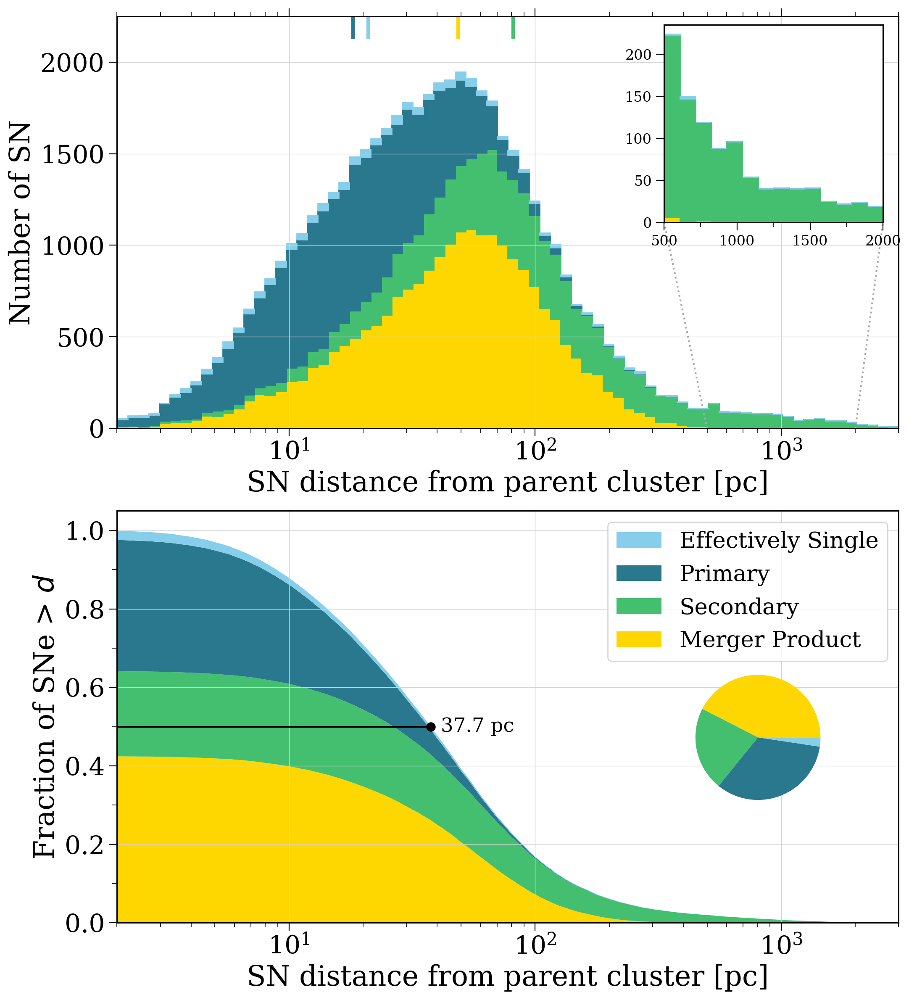

(<Figure size 1200x1400 with 3 Axes>,
 array([<Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Number of SN'>,
        <Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Fraction of SNe > $d$'>],
       dtype=object))

In [11]:
reload(plotting)
plotting.sandpile(pops["fiducial"], bins=np.geomspace(2e0, 3e3, 75), inset_n_bins=15)

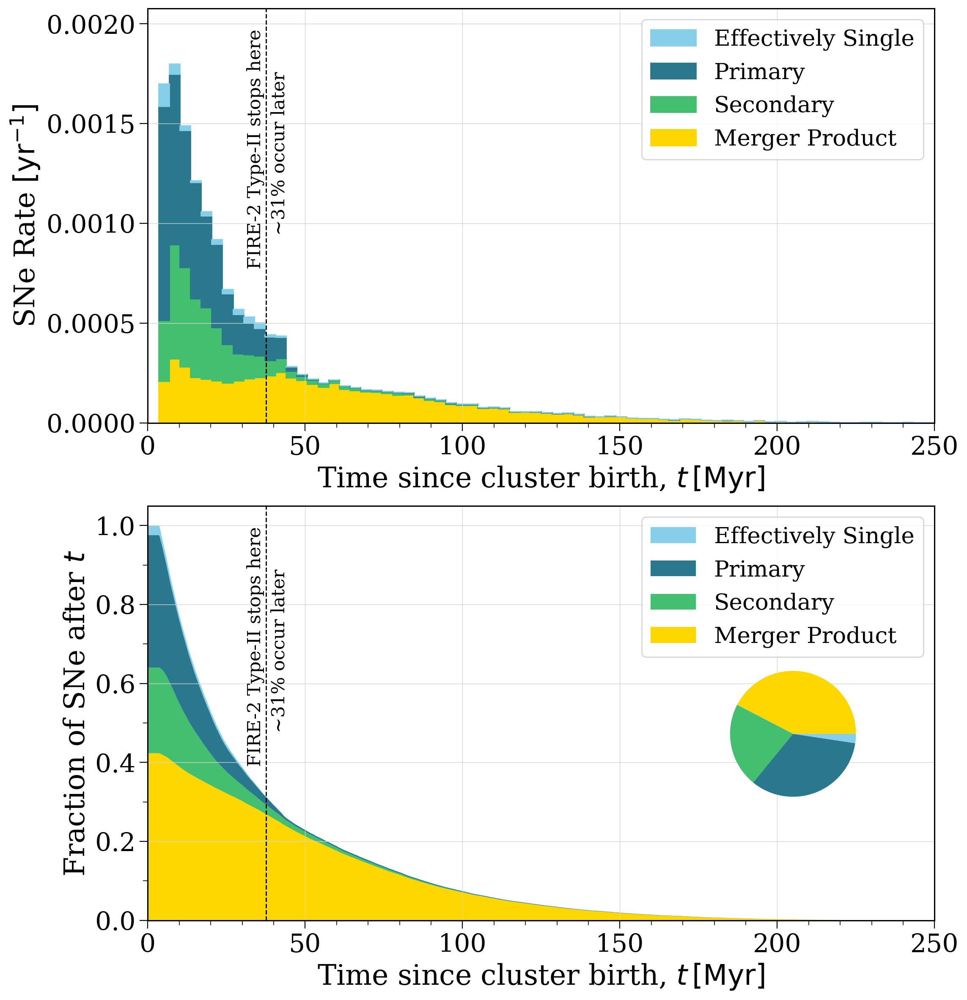

(<Figure size 1200x1400 with 2 Axes>,
 array([<Axes: xlabel='Time since cluster birth, $t \\, [\\rm Myr]$', ylabel='SNe Rate $\\rm [yr^{-1}]$'>,
        <Axes: xlabel='Time since cluster birth, $t \\, [\\rm Myr]$', ylabel='Fraction of SNe after $t$'>],
       dtype=object))

In [12]:
reload(plotting)
plotting.sandpile(pops["fiducial"], bins=np.linspace(0, 2.5e2, 75), var="time")

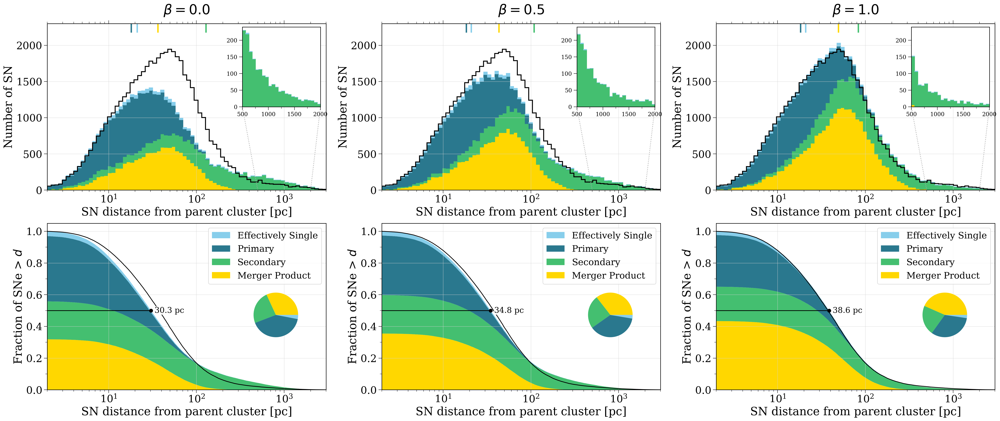

In [13]:
reload(plotting)
fig, axes = plt.subplots(2, 3, figsize=(36, 14))

for p, x, l in zip(["beta-0.0", "beta-0.5", "beta-1.0"],
                   [axes[:, 0], axes[:, 1], axes[:, 2]],
                   [r"$\beta = 0.0$", r"$\beta = 0.5$", r"$\beta = 1.0$"]):
    plotting.sandpile(pops[p], bins=np.geomspace(2e0, 3e3, 75),
                      comparison_pop=pops["fiducial"],
                      top_ax_dict={"ylim": (0, 2300)},
                      inset_ax_dict={"ylim": (0, 240)}, fig=fig, axes=x, show=False)
    x[0].set_title(l, fontsize=1.2 * fs, pad=20)
plt.show()

0.3178132737776925
0.2401320580666984
0.41214740010686535
0.029907268048743677
0.35435121347308407
0.2426305790944968
0.37672095455616
0.02629725287625885
0.43315317344150905
0.2168862365348626
0.3268400705626123
0.023120519461016256


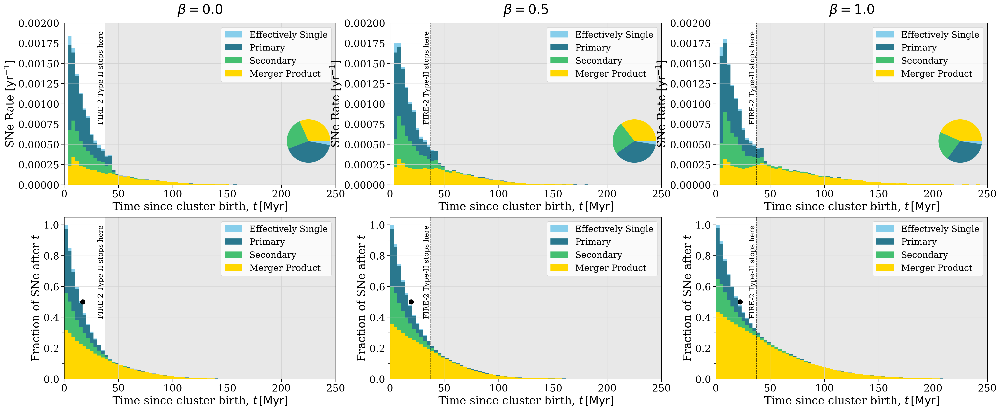

In [133]:
reload(plotting)
fig, axes = plt.subplots(2, 3, figsize=(36, 14))

for p, x, l in zip(["beta-0.0", "beta-0.5", "beta-1.0"],
                   [axes[:, 0], axes[:, 1], axes[:, 2]],
                   [r"$\beta = 0.0$", r"$\beta = 0.5$", r"$\beta = 1.0$"]):
    plotting.sandpile(pops[p], bins=np.linspace(0, 250, 75),
                      #comparison_pop=pops["fiducial"],
                      var="time",
                      top_ax_dict={"ylim": (0, 0.002)}, fig=fig, axes=x, show=False)
    x[0].set_title(l, fontsize=1.2 * fs, pad=20)
plt.show()

0.027445633953913
0.3254810808394615
0.20856893815792382
0.43850434704870167
0.023765288744386284
0.3346493265211339
0.21688728905403287
0.42469809568044686
0.023120081334486724
0.3136649470949283
0.1903829498813868
0.47283202168919813


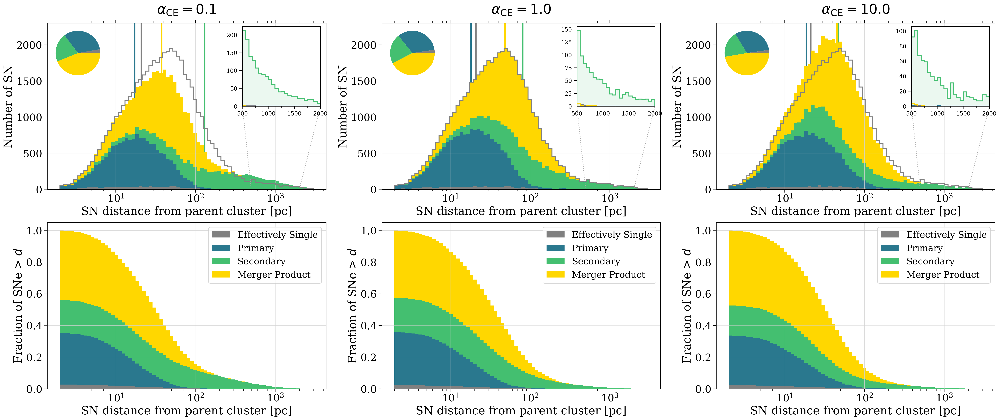

In [65]:
fig, axes = plt.subplots(2, 3, figsize=(36, 14))

for p, x, l in zip(["ce-0.1", "fiducial", "ce-10.0"],
                   [axes[:, 0], axes[:, 1], axes[:, 2]],
                   [r"$\alpha_{\rm CE} = 0.1$", r"$\alpha_{\rm CE} = 1.0$", r"$\alpha_{\rm CE} = 10.0$"]):
    plotting.sandpile(pops[p], bins=np.geomspace(2e0, 3e3, 75),
                      comparison_pop=pops["fiducial"],
                      top_ax_dict={"ylim": (0, 2300)}, fig=fig, axes=x, show=False)
    x[0].set_title(l, fontsize=1.2 * fs, pad=20)
plt.show()

0.023765288744386284
0.3346493265211339
0.21688728905403287
0.42469809568044686
0.023574582453444577
0.3319831061624118
0.22315223651372604
0.4212900748704176


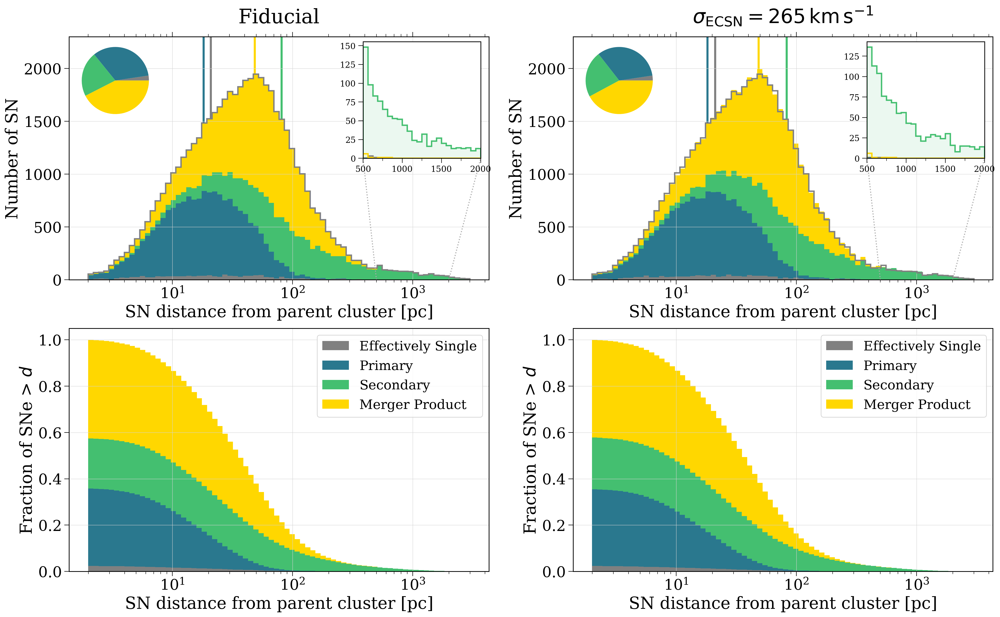

In [67]:
fig, axes = plt.subplots(2, 2, figsize=(24, 14))

for p, x, l in zip(["fiducial", "ecsn-265"],
                   [axes[:, 0], axes[:, 1]],
                   [r"Fiducial", r"$\sigma_{\rm ECSN} = 265 \, {\rm km \, s^{-1}}$"]):
    plotting.sandpile(pops[p], bins=np.geomspace(2e0, 3e3, 75),
                      comparison_pop=pops["fiducial"],
                      top_ax_dict={"ylim": (0, 2300)}, fig=fig, axes=x, show=False)
    x[0].set_title(l, fontsize=1.2 * fs, pad=20)
plt.show()

0.023765288744386284
0.3346493265211339
0.21688728905403287
0.42469809568044686
0.02406407082301614
0.3246117488183665
0.21860229574611728
0.4327218846125001


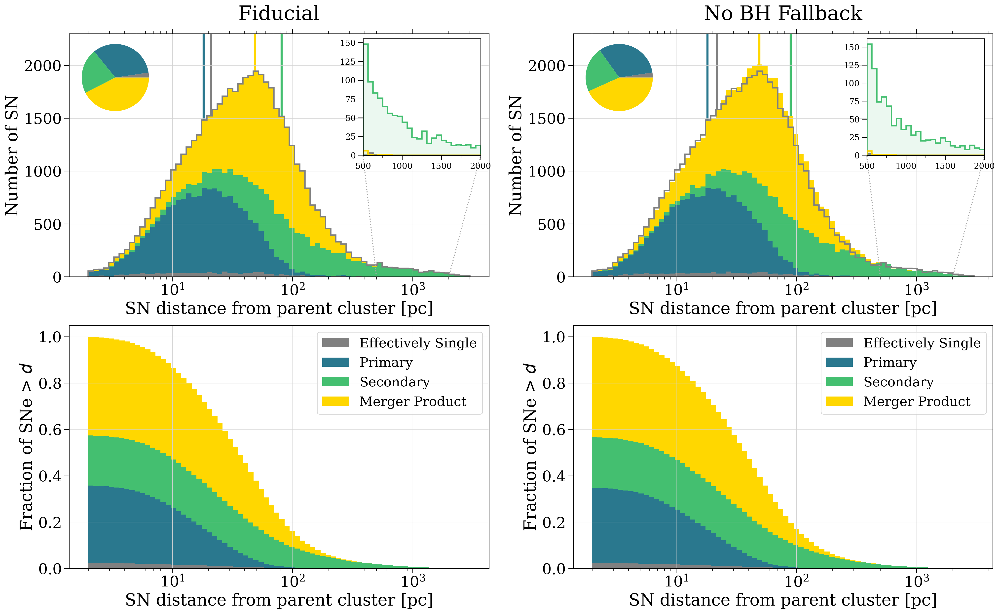

In [68]:
fig, axes = plt.subplots(2, 2, figsize=(24, 14))

for p, x, l in zip(["fiducial", "no-fallback"],
                   [axes[:, 0], axes[:, 1]],
                   [r"Fiducial", r"No BH Fallback"]):
    plotting.sandpile(pops[p], bins=np.geomspace(2e0, 3e3, 75),
                      comparison_pop=pops["fiducial"],
                      top_ax_dict={"ylim": (0, 2300)}, fig=fig, axes=x, show=False)
    x[0].set_title(l, fontsize=1.2 * fs, pad=20)
plt.show()

In [227]:
p = pops["fiducial"]

In [236]:
no_rlof = p[p.bin_nums[~np.isin(p.bin_nums, p.bpp[(p.bpp["evol_type"] >= 3) & (p.bpp["evol_type"] <= 8)]["bin_num"].unique())]]

In [ ]:
no_rlof = p

In [261]:
def get_relative_mass_gain(p, which_star="mass_1"):
    mass_change = p.bpp.groupby("bin_num")[which_star].diff().fillna(0.0)
    mass_change[mass_change < 0] = 0
    relative_mass_gain = mass_change.groupby(mass_change.index).sum() / p.initC[which_star]
    return relative_mass_gain * 100

(array([1.2329e+04, 2.6100e+02, 1.3300e+02, 7.4000e+01, 7.0000e+01,
        3.3000e+01, 2.2000e+01, 8.0000e+00, 5.0000e+00, 1.0000e+00]),
 array([0.        , 0.17499994, 0.34999989, 0.52499983, 0.69999977,
        0.87499972, 1.04999966, 1.2249996 , 1.39999955, 1.57499949,
        1.74999943]),
 <BarContainer object of 10 artists>)

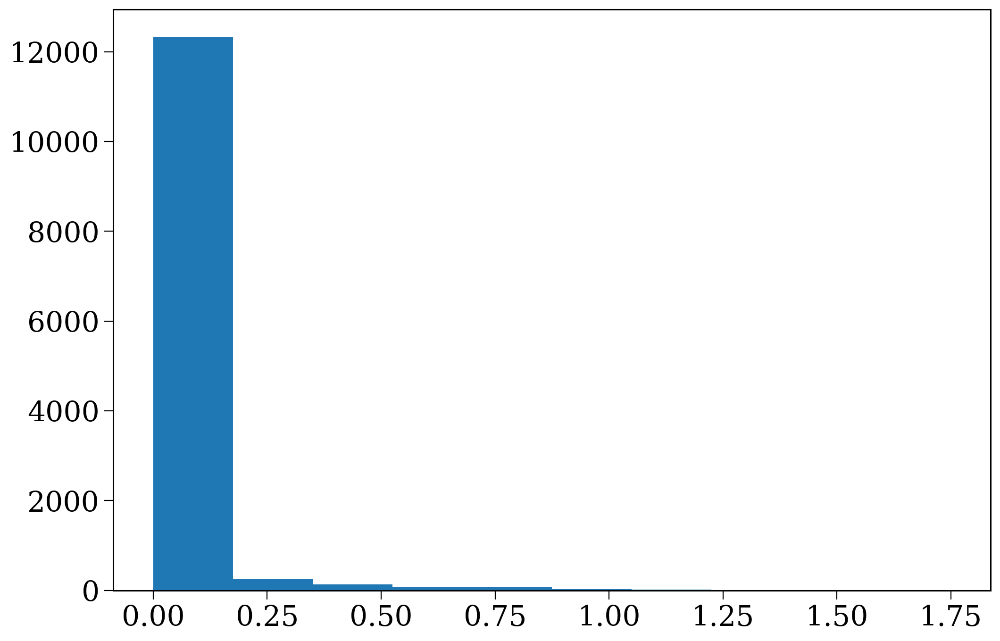

In [262]:
plt.hist(get_relative_mass_gain(no_rlof))

0.7487631416202845

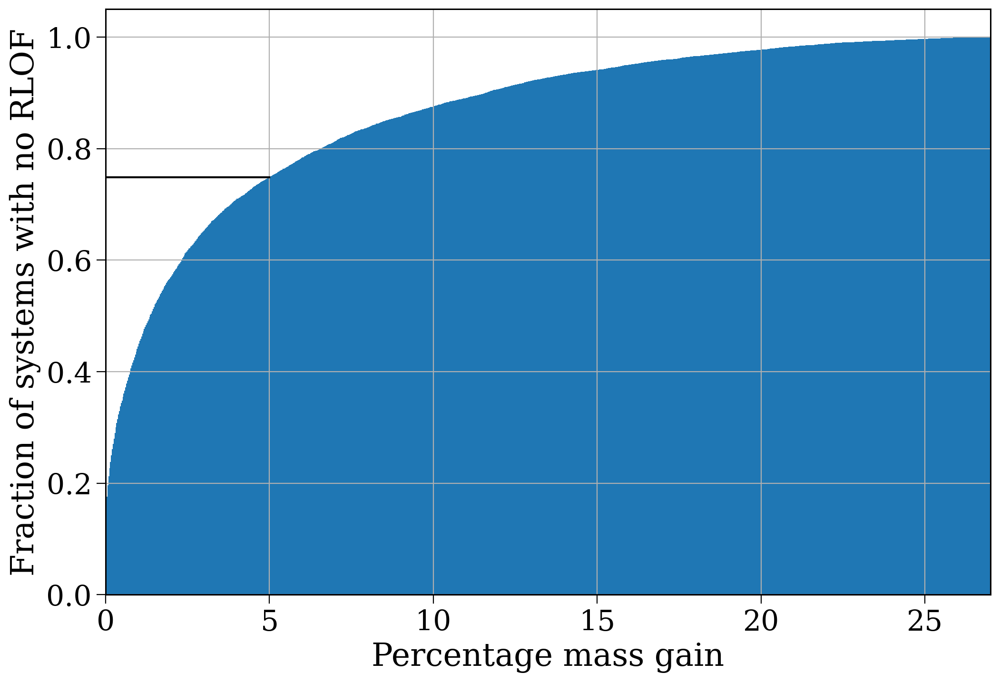

In [279]:
fig, ax = plt.subplots()

rmg = get_relative_mass_gain(no_rlof, "mass_2")
ax.hist(rmg, bins=1000, cumulative=True, density=True)
ax.plot([0, 5], [1 - len(rmg[rmg > 5]) / len(rmg), 1 - len(rmg[rmg > 5]) / len(rmg)], color="black")

ax.set(xlabel="Percentage mass gain", ylabel="Fraction of systems with no RLOF", xlim=(0, 27))

ax.grid()

plt.show()

In [224]:
def non_interacting_fraction(p):
    rlof_nums = p.bpp[(p.bpp["evol_type"] >= 3) & (p.bpp["evol_type"] <= 8)]["bin_num"].unique()
    interaction_nums = np.concatenate((rlof_nums, p.bpp["bin_num"][(p.bpp.groupby("bin_num")["mass_1"].diff().fillna(0.0) > 0.0)
                                                                   | (p.bpp.groupby("bin_num")["mass_2"].diff().fillna(0.0) > 0.0)].unique()))
    return 1 - len(np.unique(rlof_nums)) / len(p)

In [225]:
for p in pops:
    print(p, non_interacting_fraction(pops[p]))

fiducial 0.17027774121363692
ce-0.1 0.17027549986178936
ce-10.0 0.17032258064516126
beta-0.0 0.17027549986178936
beta-0.5 0.17027549986178936
beta-1.0 0.17027774121363692
ecsn-265 0.17027774121363692
no-fallback 0.17027774121363692


# Fractions

In [14]:
labels = ["Effectively Single", "Primary", "Secondary", "Merger Product"]
colours = ["skyblue", plt.cm.viridis(0.4), plt.cm.viridis(0.7), "gold"]

labels = list(reversed(labels))
colours = list(reversed(colours))

In [15]:
def lighten_colour(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

In [16]:
pop_details = {
    "file_names": ["fiducial", "ce-0.1", "ce-10.0", "beta-0.0", "beta-0.5", "beta-1.0", "ecsn-265", "no-fallback"],
    "labels": ["Fiducial", r"$\alpha_{\rm CE} = 0.1$", r"$\alpha_{\rm CE} = 10.0$", r"$\beta = 0.0$", r"$\beta = 0.5$",
               r"$\beta = 1.0$", r"$\sigma_{\rm low} = $" + "\n" + r"$265 \, {\rm km/s}$", "No fallback"],
}

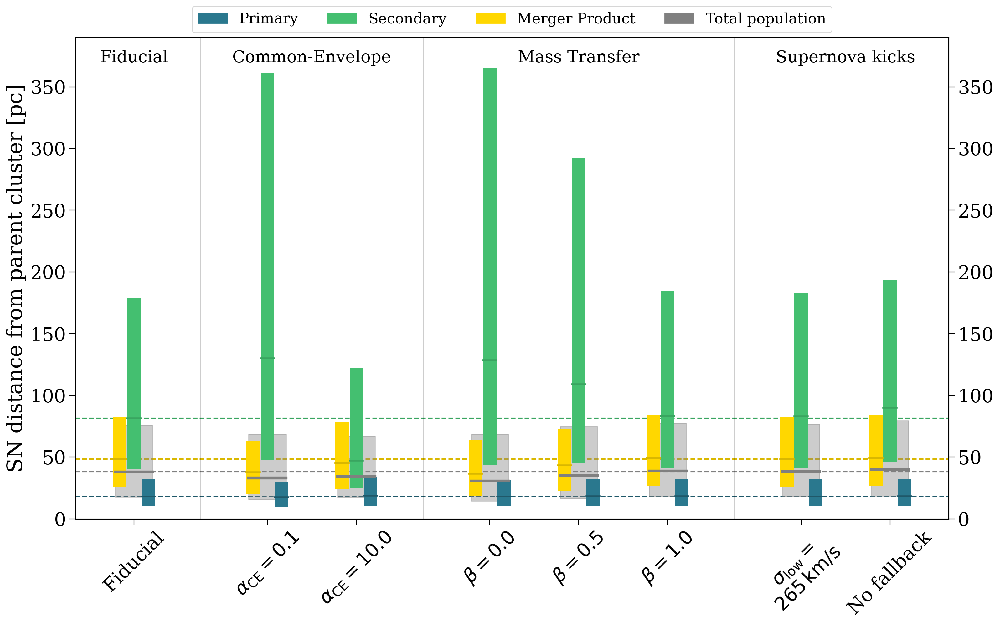

In [18]:
fig, ax = plt.subplots(figsize=(18, 10))

intraspacing = 0.16
gap_inds = [1, 3, 6]
group_labels = ["Fiducial", "Common-Envelope", "Mass Transfer", "Supernova kicks"]
combo_col = "grey"

# determine the positions based on gaps/groups
positions = np.arange(len(pops)).astype(float)
for g in gap_inds:
    positions[g:] += 0.5

# add separator lines
for g in gap_inds:
    ax.axvline(np.mean(positions[g - 1:g + 1]) + 0.16, color="black", lw=0.5)
    
# define the groups of positions to find the centres of each group
groups = []
for i in range(len(gap_inds) - 1):
    if i == 0:
        groups.append((0, gap_inds[i]))
    groups.append((gap_inds[i], gap_inds[i + 1]))
    if i == len(gap_inds) - 2:
        groups.append((gap_inds[i + 1], None))
        
# label the group at its centre
for g, l in zip(groups, group_labels):
    ax.annotate(l, xy=(np.mean(positions[g[0]:g[1]] + intraspacing), 380), fontsize=0.8*fs, ha="center", bbox=dict(boxstyle="round", fc="white", ec='white'), va="top")
ax.set_ylim(top=390)

for j, p in enumerate(pops):
    data, weights = plotting.get_data_and_weights(pops[p], "distance")
    data = data[:-1]
    
    combo_data = np.concatenate(data)

    for i in range(len(data)):
        ax.boxplot(data[i],
                    patch_artist=True,
                    vert=True,
                    showfliers=False,
                    showcaps=False,
                    boxprops=dict(facecolor=colours[i], edgecolor="none"),
                    positions=[positions[j] + i * intraspacing],
                    whis=0,
                    medianprops=dict(color=lighten_colour(colours[i], 1.15), lw=2, zorder=10, alpha=1))
        
        if p == 'fiducial':
            ax.axhline(np.median(data[i]), color=lighten_colour(colours[i], 1.15), zorder=-1, linestyle="--")
    
    comb_low, comb_med, comb_high = np.percentile(combo_data, [25, 50, 75])
    ax.fill_between([positions[j] - 0.05, positions[j] + intraspacing * 2 + 0.05],
                    [comb_low, comb_low], [comb_high, comb_high],
                    color=combo_col, alpha=0.4, zorder=-1)
    ax.plot([positions[j] - 0.05, positions[j] + intraspacing * 2 + 0.05], [comb_med, comb_med], lw=3, color=combo_col)
    if p == "fiducial":
        ax.axhline(comb_med, color=combo_col, zorder=-1, linestyle="--")
        
            
for l, c in zip(reversed(labels[:-1]), reversed(colours[:-1])):
    ax.axvspan(np.nan, np.nan, color=c, label=l)
ax.axvspan(np.nan, np.nan, color=combo_col, label="Total population")
ax.legend(loc="upper center", ncol=4, bbox_to_anchor=(0.5, 1.08), fontsize=0.7*fs)
            
ax.set(yscale="linear", ylabel=plotting.xlabel["distance"],
       xticks=positions + intraspacing)
ax.set_xticklabels(pop_details["labels"], rotation=45)

top_ax = ax.twinx()
top_ax.set(ylim=ax.get_ylim(), yscale="linear")

plt.show()

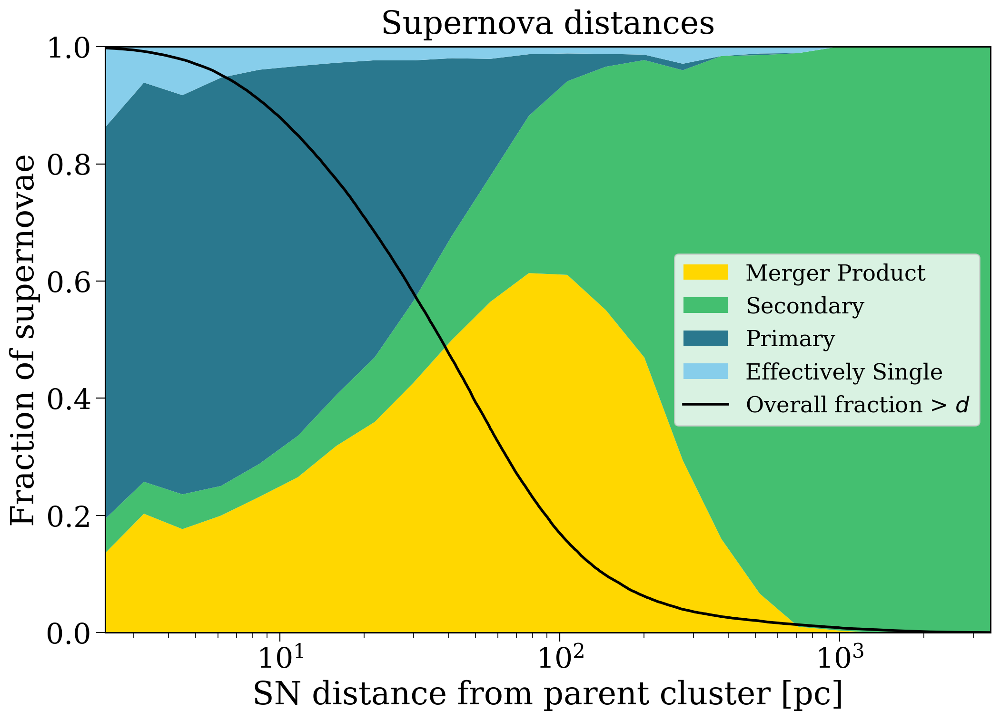

In [19]:
fig, ax = plt.subplots()

bins = np.geomspace(2e0, 4e3, 25)
bin_centres, widths = plotting.get_centres_widths(bins)

data, weights = plotting.get_data_and_weights(pops["fiducial"], "distance")

hists = np.array([np.histogram(d, weights=w, bins=bins)[0].astype(float) for d, w in zip(data, weights)])
norm_hists = hists / hists.sum(axis=0)

bottom = np.zeros(hists.shape[1])
for h, c, l in zip(norm_hists, colours, labels):
    ax.fill_between(x=bin_centres, y1=bottom, y2=h + bottom, color=c, label=l, lw=0)
    bottom += h
    
detail_bins = np.geomspace(bins[0], bins[-1], 1000)
detail_bin_centres, _ = plotting.get_centres_widths(detail_bins)

hists = np.array([np.histogram(d, bins=detail_bins)[0].astype(float) for d in data])
chist = np.sum([np.sum(h) - np.cumsum(h) for h in hists], axis=0)
chist /= chist[0]

ax.plot(detail_bin_centres, chist, color="black", lw=2, label=r"Overall fraction > $d$")
    
ax.set(xscale="log", xlim=bin_centres[[0, -1]], ylim=(0, 1),
       xlabel=plotting.xlabel["distance"], ylabel="Fraction of supernovae")
ax.legend(loc="center right", fontsize=0.7*fs)
ax.set_title("Supernova distances", fontsize=fs, pad=10)
plt.show()

In [383]:
p = pops["fiducial"]

In [390]:
sn_rows = p.bpp[((p.bpp["evol_type"] == 15)
                 | (p.bpp["evol_type"] == 15))
                & ~p.bpp["bin_num"].isin(p.duplicate_sn)]

In [407]:
late_sn_1 = sn_rows[p.sn_1][sn_rows[p.sn_1]["tphys"] > 50]

In [408]:
late_sn_1[late_sn_1["kstar_1"] != 12]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
50402,62.511232,1.464850,1.277584,9.0,13.0,-1.000000,-1.000000e+00,-1.000000,1.000000e-04,0.000100,15.0,7.602742,0.872672,6.849794,1.000000e+10,1.439504,1.277584,308.356343,0.000014,1.648547,2.477002,85932.624089,0.030946,5653.048168,649916.878488,0.001232,0.000014,5.807434e-04,1.000000e-10,1.196808e+02,1.000000e-10,3.152264e+10,5.570757e+07,0.0,1.935073e+13,0.0,0.0,0.0,0.0,54.908418,61.638488,0.0,0.0,50402
73402,62.470266,1.478559,1.277584,9.0,13.0,-1.000000,-1.000000e+00,-1.000000,1.000000e-04,0.000100,15.0,7.598957,0.980503,6.846341,1.000000e+10,1.440000,1.277584,325.680788,0.000014,1.648945,2.522742,86045.425927,0.024514,5502.442181,613138.832303,0.000070,0.000014,2.354166e-03,1.000000e-10,1.618687e+02,1.000000e-10,1.199760e+11,3.274626e+08,0.0,3.120293e+12,0.0,0.0,0.0,0.0,54.871303,61.489757,0.0,0.0,73402
211512,61.185347,1.547682,1.277584,9.0,13.0,-1.000000,-1.000000e+00,-1.000000,1.000000e-04,0.000100,15.0,7.088861,0.809513,6.390487,1.000000e+10,1.436959,1.277584,334.019769,0.000014,1.704596,2.548548,76982.945095,0.035964,5284.235390,674794.475114,0.003053,0.000014,3.279633e-02,1.000000e-10,2.456984e+02,1.000000e-10,1.025352e+12,2.309498e+08,0.0,1.024054e+12,0.0,0.0,0.0,0.0,54.095996,60.375344,0.0,0.0,211512
278503,65.346969,1.460560,1.277584,9.0,13.0,-1.000000,-1.000000e+00,-1.000000,1.000000e-04,0.000100,15.0,7.875738,1.093271,7.094289,1.000000e+10,1.440000,1.277584,304.460251,0.000014,1.621165,2.498001,90422.019291,0.019718,5761.994785,580656.720710,0.000070,0.000014,1.667332e-04,1.000000e-10,9.134261e+01,1.000000e-10,4.444507e+10,7.081346e+08,0.0,5.373032e+11,0.0,0.0,0.0,0.0,57.471225,64.253692,0.0,0.0,278503
279379,52.107786,1.421817,6.221547,6.0,1.0,58847.190138,5.984371e+05,0.371440,5.068059e-02,0.000546,15.0,52.300502,50.290117,46.209959,6.250513e+01,1.421817,0.000000,5.332158,4.462486,7.256575,6.221547,96115.784404,2412.548530,44209.618474,19235.355367,0.007485,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.956154e+00,1.547103e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-0.196355,1.814014,0.0,0.0,279379
283815,62.940985,1.514361,1.277584,9.0,13.0,-1.000000,-1.000000e+00,-1.000000,1.000000e-04,0.000100,15.0,7.254478,1.198004,6.538087,1.000000e+10,1.440000,1.277584,332.020955,0.000014,1.685877,2.499436,80482.980082,0.016421,5359.359328,554694.807497,0.000070,0.000014,1.279107e-02,1.000000e-10,2.138101e+02,1.000000e-10,4.108446e+11,5.625192e+08,0.0,1.303487e+12,0.0,0.0,0.0,0.0,55.686501,61.742974,0.0,0.0,283815
291143,66.901745,1.476617,1.277584,9.0,13.0,-1.000000,-1.000000e+00,-1.000000,1.000000e-04,0.000100,15.0,7.927552,1.541071,7.140728,1.000000e+10,1.440000,1.277584,338.378930,0.000014,1.616138,2.542603,91314.037052,0.009924,5479.013116,489071.039294,0.000070,0.000014,2.125814e-03,1.000000e-10,1.660774e+02,1.000000e-10,2.578973e+11,1.406621e+08,0.0,4.568797e+12,0.0,0.0,0.0,0.0,58.974186,65.360667,0.0,0.0,291143
298298,54.237335,1.396049,7.439082,6.0,1.0,3200.266831,7.059029e+03,0.000000,8.361103e-01,0.002850,15.0,54.484419,32.706003,47.855671,4.405614e+01,1.396049,0.000000,0.002338,4.804808,7.129774,7.439082,30.545178,3963.069018,281893.461379,20986.475787,0.002338,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.030653e+08,5.096560e+03,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-0.247089,21.531326,0.0,0.0,298298
339215,50.281712,1.388621,5.268498,6.0,1.0,259.226856,1.874774e+02,0.000000,1.989554e-07,0.025935,15.0,0.000000,45.507596,44.487666,9.057804e+01,1.242000,0.000000,1026.331461,3.339772,1.388621,5.268498,113792.800651,927.650835,3323.950032,17508.838222,0.000014,0.000000,3.489313e+00,1.000000e-10,9.886502e+02,1.000000e-10,4.654723e-01,4.654723e-01,0.0,0.000000e+00,0.0,0.0,0.0,0.0,-0.

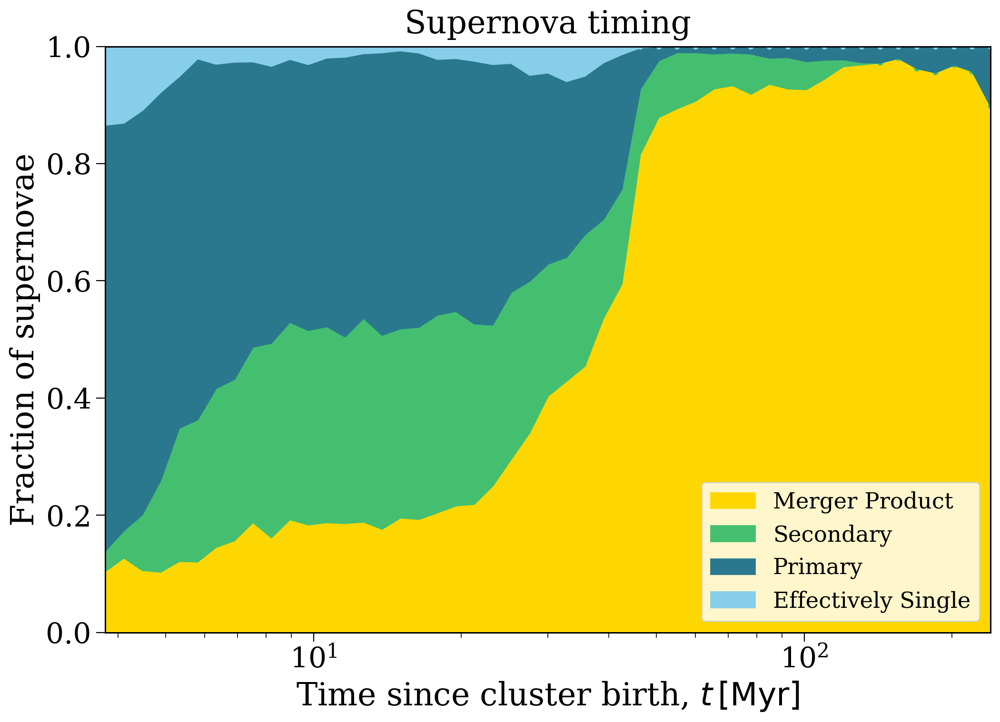

In [445]:
reload(plotting)
fig, ax = plt.subplots()

bins = np.geomspace(3.6, 250, 50)
bin_centres, widths = plotting.get_centres_widths(bins)

data, weights = plotting.get_data_and_weights(pops["fiducial"], "time", widths)

hists = np.array([np.histogram(d, weights=w, bins=bins)[0].astype(float) for d, w in zip(data, weights)])
norm_hists = hists / hists.sum(axis=0)

bottom = np.zeros(hists.shape[1])
for h, c, l in zip(norm_hists, colours, labels):
    ax.fill_between(x=bin_centres, y1=bottom, y2=h + bottom, color=c, label=l, lw=1)
    ax.scatter(bin_centres, h + bottom, color=c, marker="o", s=10)
    bottom += h
ax.set(xscale="log", xlim=bin_centres[[0, -1]], ylim=(0, 1),
       xlabel=plotting.xlabel["time"], ylabel="Fraction of supernovae")
ax.set_title("Supernova timing", fontsize=fs, pad=10)
ax.legend(loc="lower right", fontsize=0.7*fs)
plt.show()

# Time evolution

In [12]:
p = pops["fiducial"]

In [13]:
sn_rows_1 = p.bpp[p.bpp["evol_type"] == 15]
sn_rows_2 = p.bpp[p.bpp["evol_type"] == 16]

In [14]:
sn_times_1 = sn_rows_1["tphys"]
sn_times_2 = sn_rows_2["tphys"]

In [15]:
sn_type_1 = np.repeat("primary", len(sn_times_1))
sn_type_1[p.sn_1_merger] = "merger"
sn_type_1[p.sn_1_singles] = "single"

sn_type_2 = np.repeat("secondary", len(sn_times_2))
sn_type_2[p.sn_2_merger] = "merger"

In [16]:
colours = plotting.colours.copy()
colours[1] = "#44bf70"
colours[2] = "#2a788e"

In [17]:
ro = np.random.permutation(len(sn_times_1) + len(sn_times_2))

sn_times = np.concatenate((sn_times_1, sn_times_2))[ro]
sn_dists = np.concatenate((p.primary_sn_distances, p.secondary_sn_distances)).to(u.pc)[ro]
sn_types = np.concatenate((sn_type_1, sn_type_2))[ro]
sn_colours = np.repeat("#2a788e", len(sn_types)).astype(str)
for i, t in enumerate(["merger", "secondary", "primary", "single"]):
    sn_colours[sn_types == t] = colours[i]

In [18]:
colours

['gold', '#44bf70', '#2a788e', 'skyblue']

In [ ]:
time_bins

array([  3.        ,   4.96551724,   6.93103448,   8.89655172,
        10.86206897,  12.82758621,  14.79310345,  16.75862069,
        18.72413793,  20.68965517,  22.65517241,  24.62068966,
        26.5862069 ,  28.55172414,  30.51724138,  32.48275862,
        34.44827586,  36.4137931 ,  38.37931034,  40.34482759,
        42.31034483,  44.27586207,  46.24137931,  48.20689655,
        50.17241379,  52.13793103,  54.10344828,  56.06896552,
        58.03448276,  60.        ,  60.        ,  81.11111111,
       102.22222222, 123.33333333, 144.44444444, 165.55555556,
       186.66666667, 207.77777778, 228.88888889, 250.        ])

<ErrorbarContainer object of 3 artists>

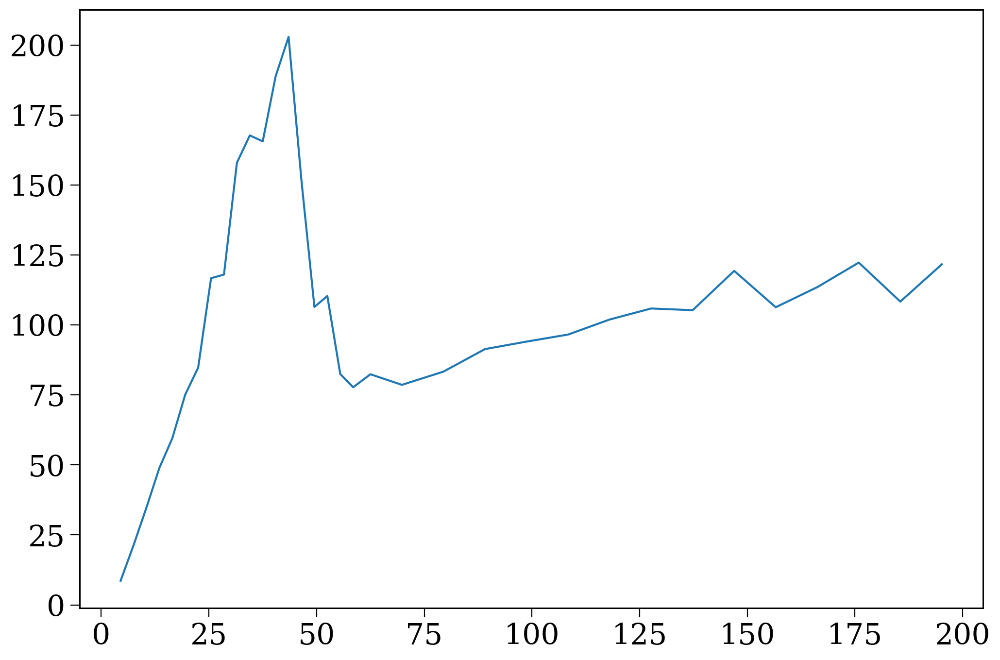

In [158]:
time_bins = np.concatenate((np.linspace(3, 60, 20), np.linspace(65, 200, 15)))
med_dists = np.zeros(len(time_bins) - 1)
std_dists = np.zeros(len(time_bins) - 1)
for i, lr in enumerate(zip(time_bins[:-1], time_bins[1:])):
    l, r = lr
    these_dists = sn_dists[(sn_times >= l) & (sn_times < r)].to(u.pc).value
    med_dists[i] = np.mean(these_dists)
    std_dists[i] = np.std(these_dists)
tbc = np.array([(time_bins[i] + time_bins[i + 1]) / 2. for i in range(len(time_bins) - 1)])
plt.errorbar(tbc, med_dists)

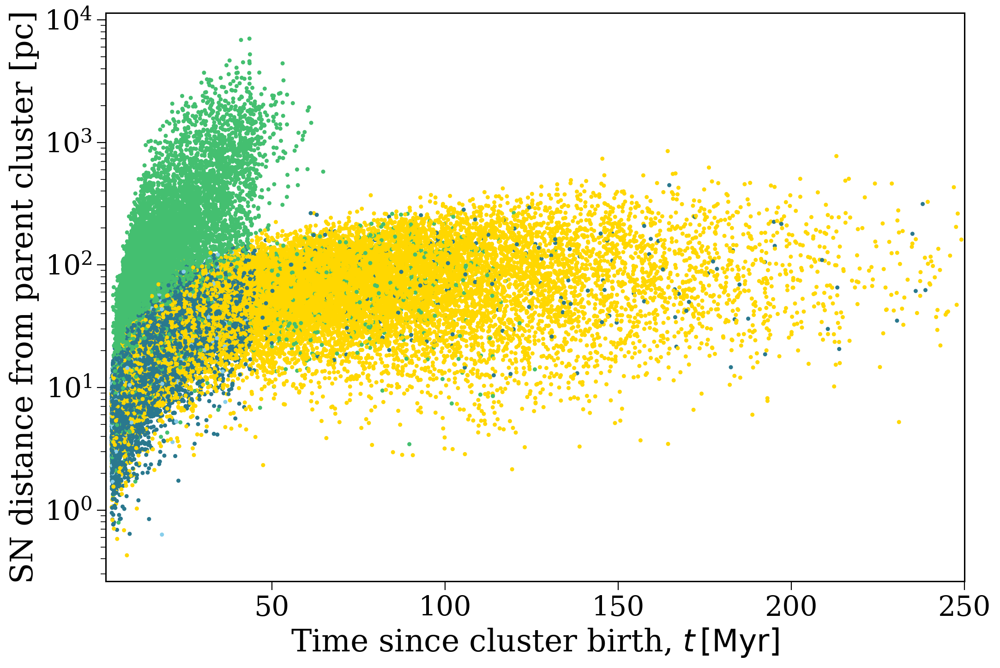

In [109]:
fig, ax = plt.subplots()

ax.scatter(sn_times, sn_dists, c=sn_colours, s=5)
ax.set(yscale="log", xlim=(2, 250), xlabel=plotting.xlabel["time"], ylabel=plotting.xlabel["distance"])

plt.show()

In [45]:
import seaborn as sns

In [46]:
sns.kdeplot

<function seaborn.distributions.kdeplot(data=None, *, x=None, y=None, hue=None, weights=None, palette=None, hue_order=None, hue_norm=None, color=None, fill=None, multiple='layer', common_norm=True, common_grid=False, cumulative=False, bw_method='scott', bw_adjust=1, warn_singular=True, log_scale=None, levels=10, thresh=0.05, gridsize=200, cut=3, clip=None, legend=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=None, **kwargs)>

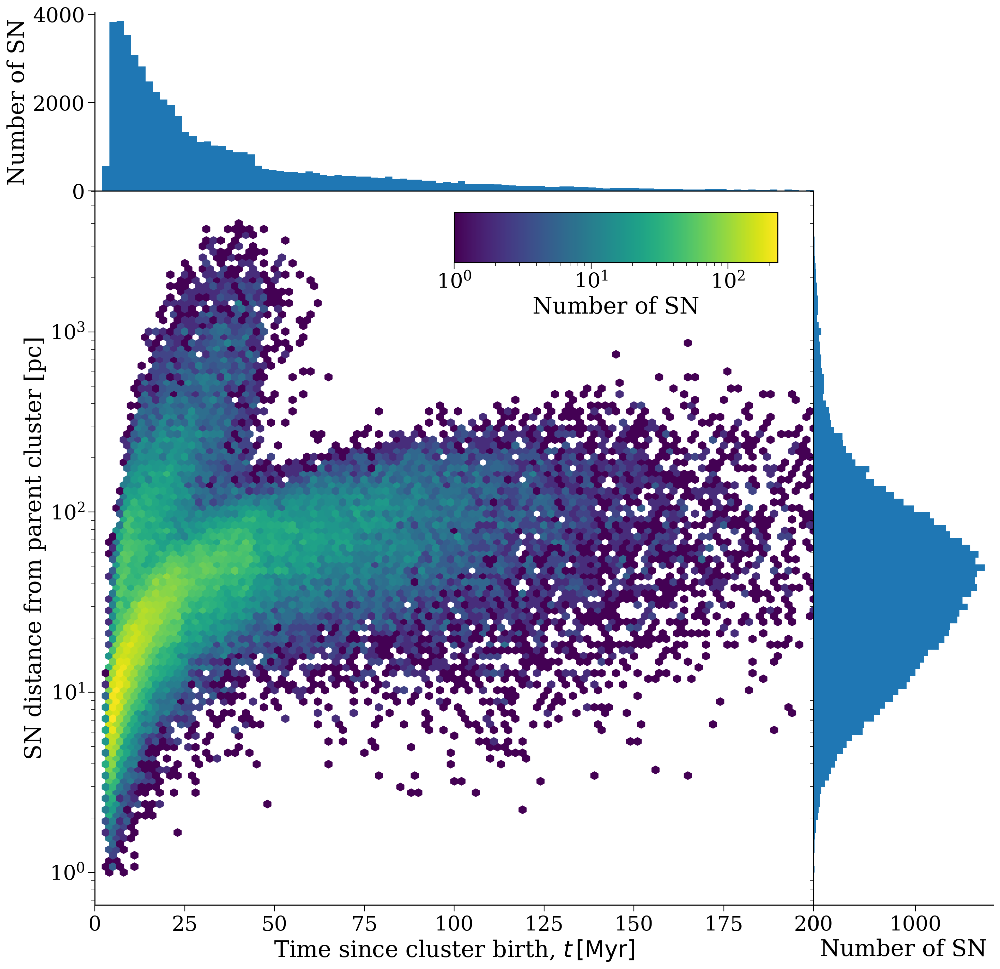

In [108]:
fig, axes = plt.subplots(2, 2, figsize=(17, 17), gridspec_kw={'height_ratios': [1, 4], 'width_ratios': [4, 1]})

fig.subplots_adjust(wspace=0.0, hspace=0.0)

axes[0, 0].hist(sn_times, bins=np.linspace(0, 200, 100))
axes[1, 1].hist(sn_dists.value, bins=np.geomspace(1e0, 4e3, 100), orientation="horizontal")

hexbin = axes[1, 0].hexbin(sn_times, sn_dists, yscale="log", gridsize=100, bins="log", extent=(0, 200, 0, np.log10(4e3)))

inset_ax = axes[1, 0].inset_axes([0.5, 0.9, 0.45, 0.07])
fig.colorbar(hexbin, cax=inset_ax, orientation='horizontal', label="Number of SN")

axes[0, 0].set(xlim=(0, 200), ylabel=plotting.top_ylabel["distance"], xticks=[])
axes[0, 0].spines[['right', 'top']].set_visible(False)
axes[0, 1].axis("off")
axes[1, 0].set(yscale="log", xlim=(0, 200), xlabel=plotting.xlabel["time"], ylabel=plotting.xlabel["distance"])
axes[1, 1].set(yscale="log", xlabel=plotting.top_ylabel["distance"], yticks=[])
axes[1, 1].spines[['right', 'top']].set_visible(False)

plt.show()

In [143]:
(300 * u.kpc / (350 *u.Myr)).to(u.km/u.s)

<Quantity 838.10761858 km / s>

In [151]:
q.bin_nums[q.final_pos[:len(q), 0] < -300 * u.kpc]

array([568147])

In [155]:
from scipy.stats import maxwell

In [182]:
maxwell(scale=265).cdf(265)

0.19874804309879915

In [173]:
q.kick_info.loc[568147]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
568147,2.0,0.0,1192.071285,57.257133,7.895643,0.0,-904.681451,-35.223893,775.464182,1192.071285,-0.0,0.0,0.0,0.0,0.0,0.0,-81436240.0,568147.0
568147,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,568147.0


In [149]:
q.bin_nums

array([    80,     81,     82, ..., 776964, 776965, 776966])

In [148]:
q.final_pos[]

<Quantity [[-371.29717952,   29.79498874,   -1.94668538]] kpc>

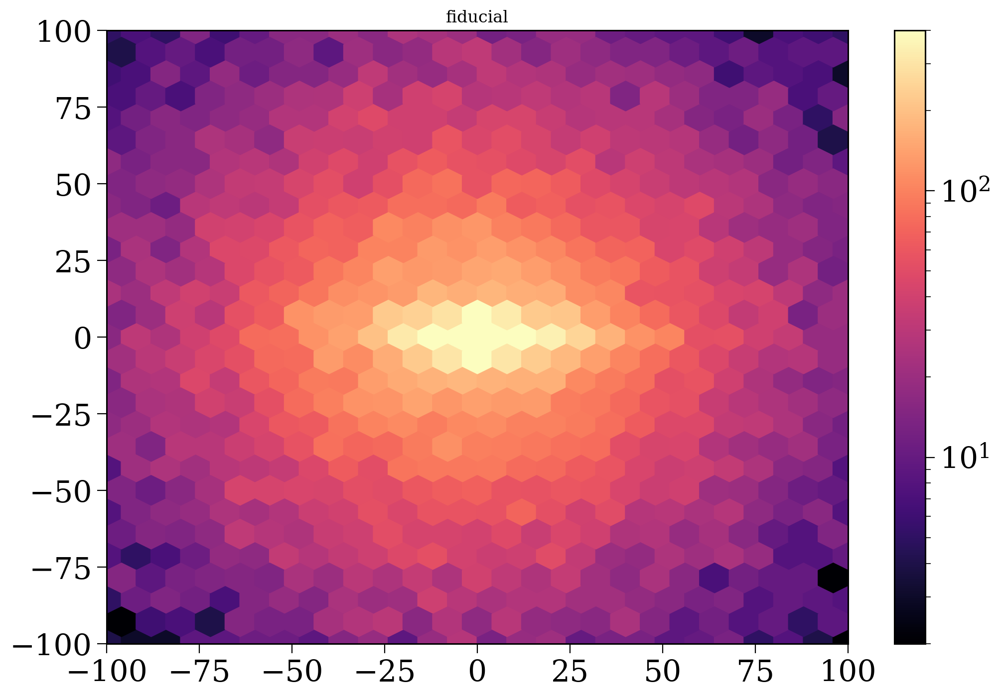

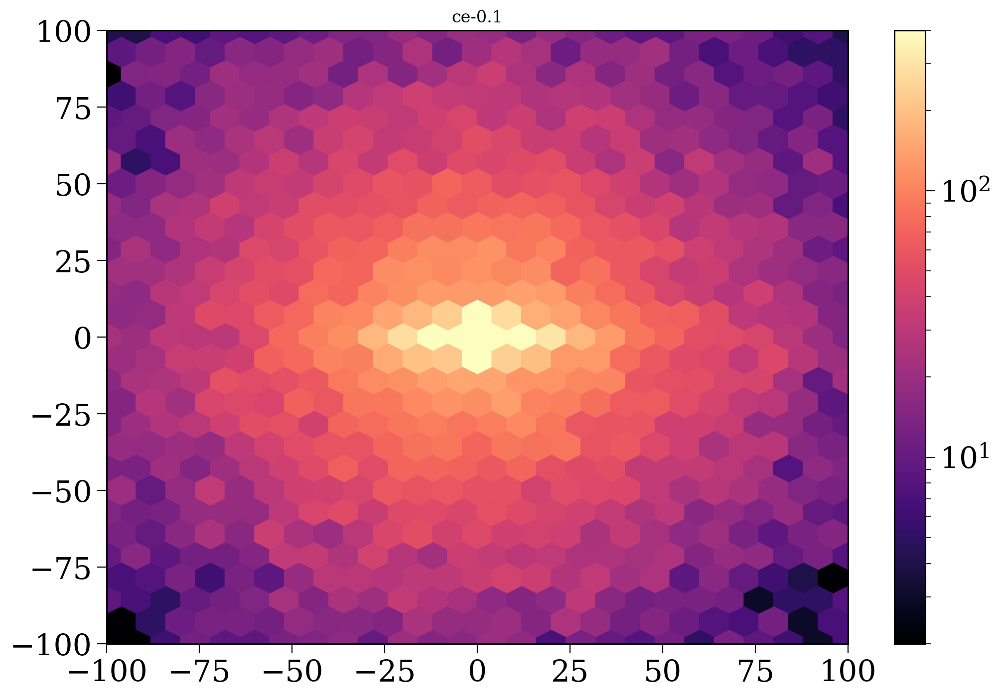

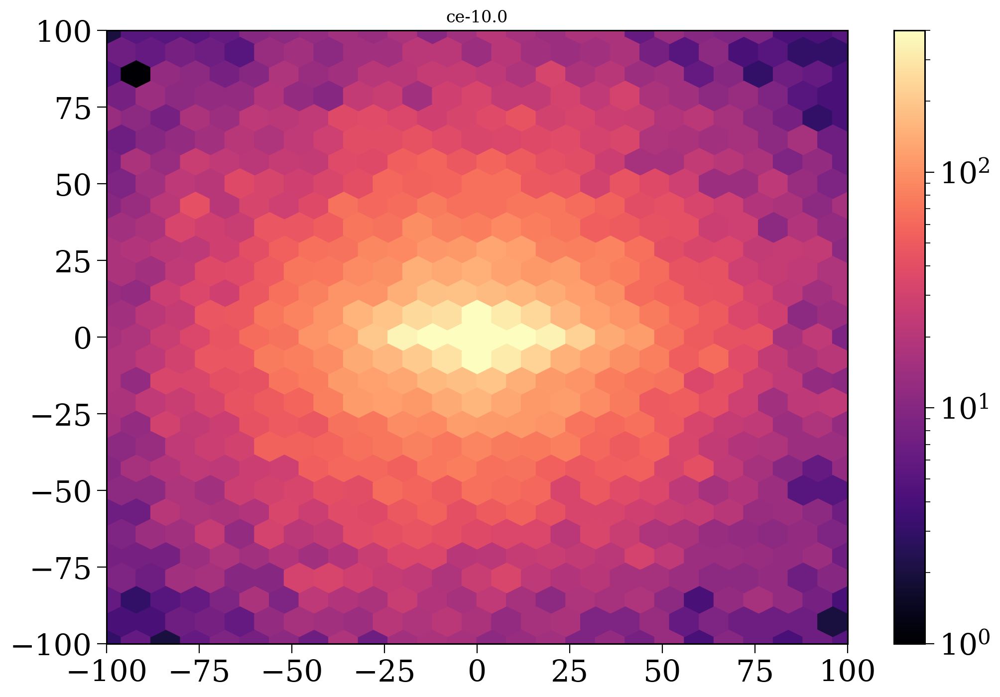

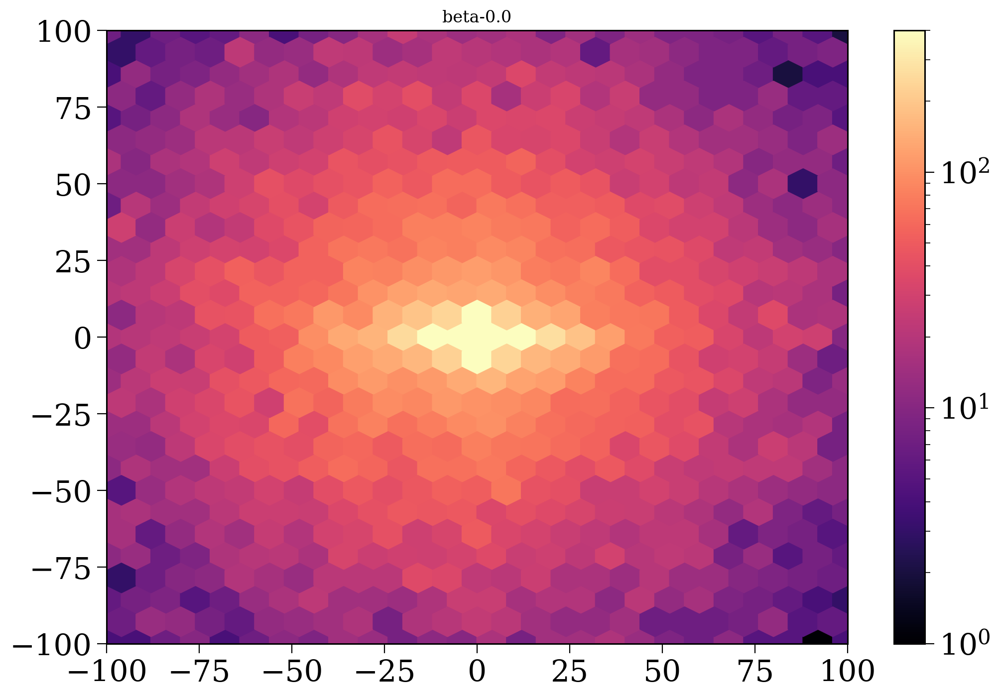

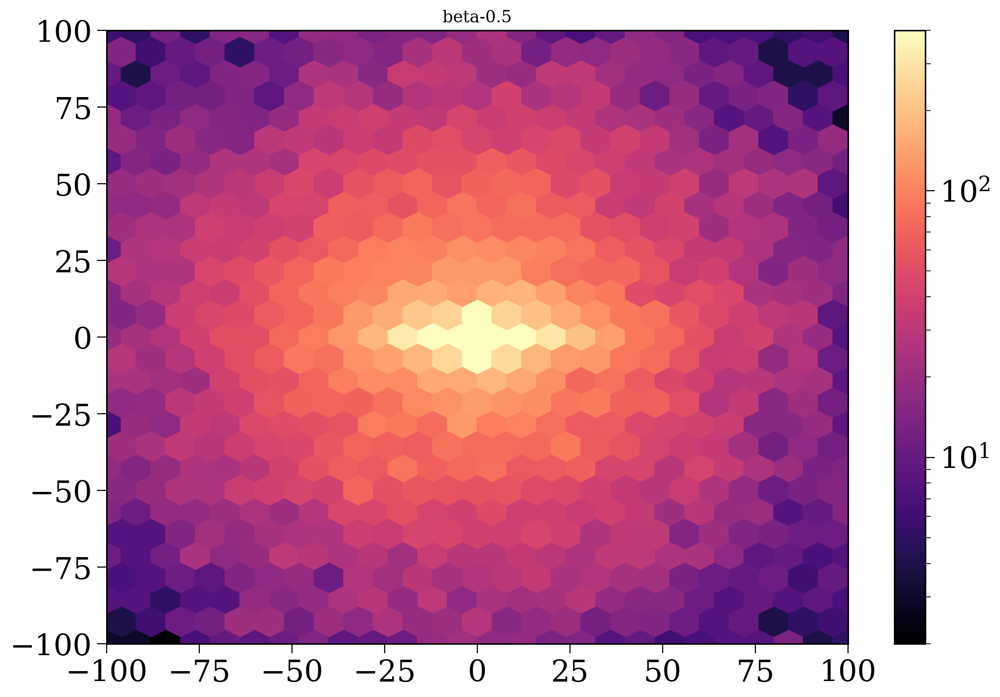

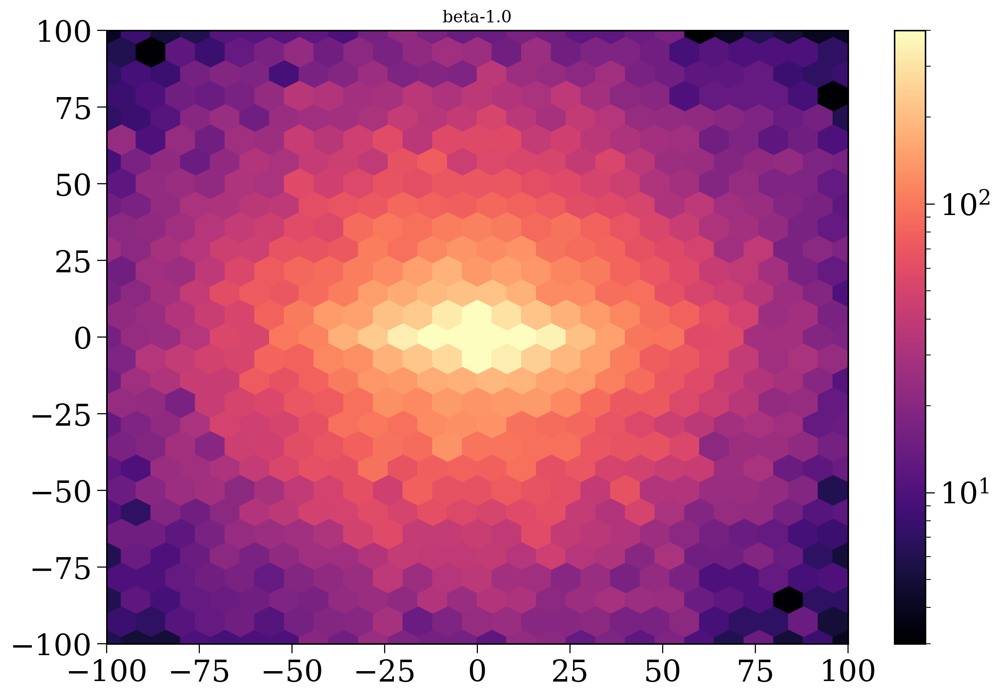

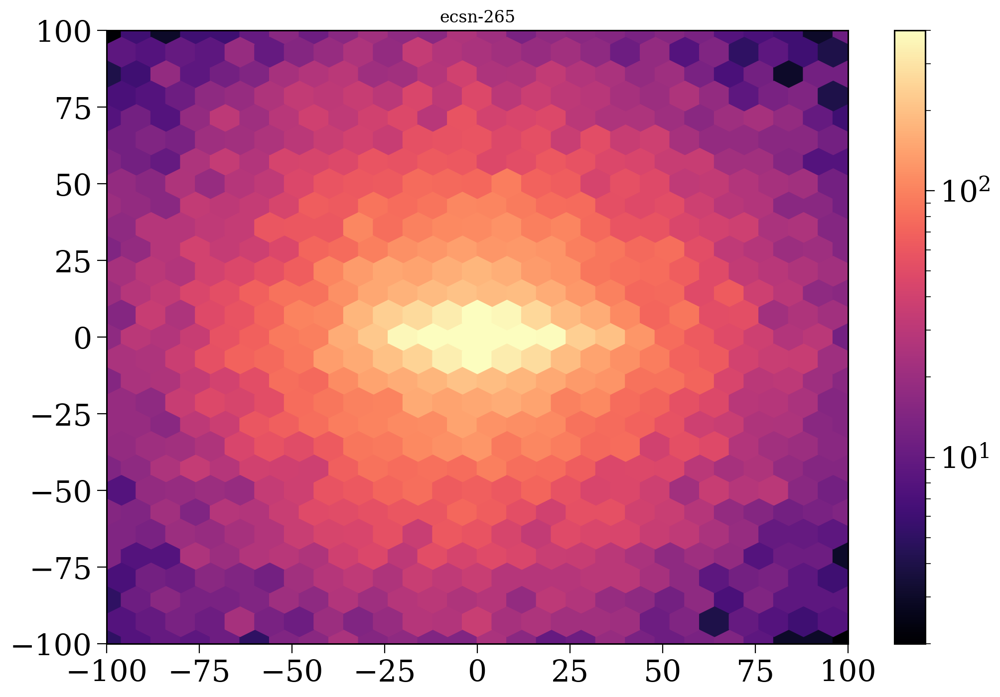

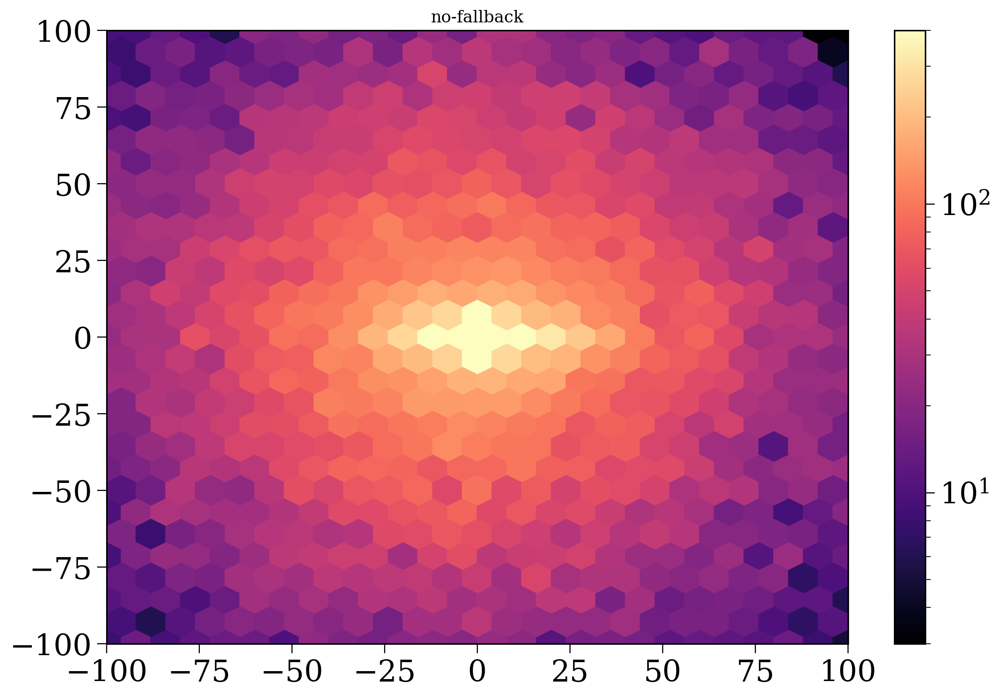

In [194]:
for p in pops:
    pops[p].final_pos
    q = pops[p][pops[p].final_bpp["kstar_1"].isin([13, 14]) | pops[p].final_bpp["kstar_2"].isin([13, 14])]
    
    pos_bound = q.final_pos[:len(q)][~q.disrupted]
    pos_dis_1 = q.final_pos[:len(q)][q.disrupted & q.final_bpp["kstar_1"].isin([13, 14])]
    pos_dis_2 = q.final_pos[len(q):][q.final_bpp[q.disrupted]["kstar_2"].isin([13, 14])]
    
    pos = np.concatenate((pos_bound, pos_dis_1, pos_dis_2))
    
    lim = 100
    
    hexbin = plt.hexbin(pos[:, 0], pos[:, 2], gridsize=25, extent=(-lim, lim, -lim, lim), cmap="magma", bins="log", vmax=400)
    plt.colorbar(hexbin)
    
    plt.xlim(-lim, lim)
    plt.ylim(-lim, lim)
    plt.title(p)
    plt.show()

gold
#44bf70
#2a788e
skyblue


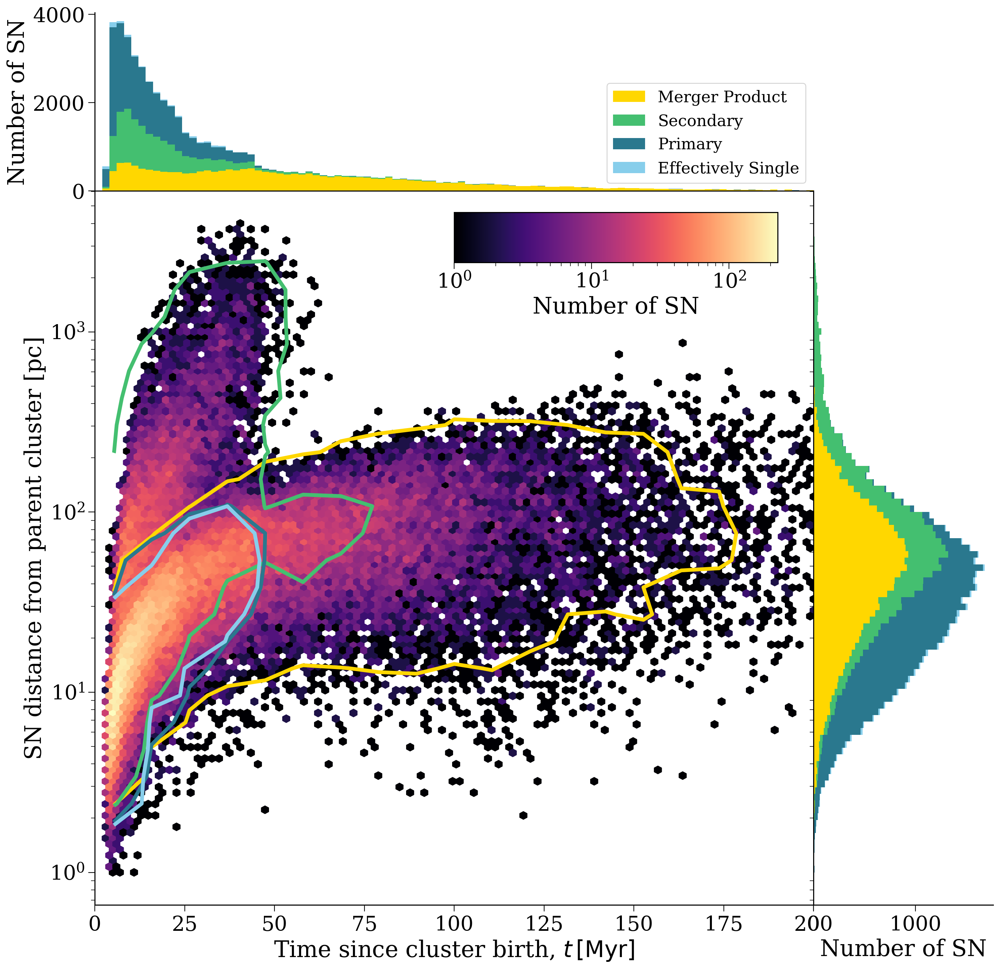

In [112]:
fig, axes = plt.subplots(2, 2, figsize=(17, 17), gridspec_kw={'height_ratios': [1, 4], 'width_ratios': [4, 1]})

fig.subplots_adjust(wspace=0.0, hspace=0.0)

for colour in colours:
    
    print(colour)
    x = sn_times[sn_colours == colour]
    y = sn_dists.value[sn_colours == colour]
    
    xedges = np.linspace(0, 200, 20)
    yedges = np.geomspace(1, 4e3, 25)
    
    hist, xedges, yedges = np.histogram2d(x, y, bins=[xedges, yedges])    
    hist_norm = hist / np.sum(hist)

    # flatten the histogram and sort it in descending order
    hist_flat = hist_norm.flatten()
    hist_sorted = np.sort(hist_flat)[::-1]

    # compute the cumulative sum
    cumulative_sum = np.cumsum(hist_sorted)

    # find the 50% contour level
    contour_level = hist_sorted[np.searchsorted(cumulative_sum, 0.95)]

    # create meshgrid for the histogram
    xcenters = (xedges[:-1] + xedges[1:]) / 2
    ycenters = (yedges[:-1] + yedges[1:]) / 2
    X, Y = np.meshgrid(xcenters, ycenters)

    axes[1, 0].contour(X, Y, hist_norm.T, levels=[contour_level], colors=colour, linewidths=4)
    
axes[0, 0].hist([sn_times[sn_colours == colour] for colour in colours], stacked=True, bins=np.linspace(0, 200, 100), color=colours, label=plotting.labels)
axes[1, 1].hist([sn_dists.value[sn_colours == colour] for colour in colours], stacked=True, bins=np.geomspace(1e0, 4e3, 100), orientation="horizontal", color=colours)

axes[0, 0].legend(fontsize=0.7*fs, loc="lower right")

hexbin = axes[1, 0].hexbin(sn_times, sn_dists, yscale="log", gridsize=100, bins="log", extent=(3, 200, 0, np.log10(4e3)), cmap="magma")

inset_ax = axes[1, 0].inset_axes([0.5, 0.9, 0.45, 0.07])
fig.colorbar(hexbin, cax=inset_ax, orientation='horizontal', label="Number of SN")

axes[0, 0].set(xlim=(0, 200), ylabel=plotting.top_ylabel["distance"], xticks=[])
axes[0, 0].spines[['right', 'top']].set_visible(False)
axes[0, 1].axis("off")
axes[1, 0].set(yscale="log", xlim=(0, 200), xlabel=plotting.xlabel["time"], ylabel=plotting.xlabel["distance"])
axes[1, 1].set(yscale="log", xlabel=plotting.top_ylabel["distance"], yticks=[])
axes[1, 1].spines[['right', 'top']].set_visible(False)

plt.show()